# Interacting with CLIP

This is a self-contained notebook that shows how to download and run CLIP models, calculate the similarity between arbitrary image and text inputs, and perform zero-shot image classifications.

# Preparation for Colab

Make sure you're running a GPU runtime; if not, select "GPU" as the hardware accelerator in Runtime > Change Runtime Type in the menu. The next cells will install the `clip` package and its dependencies, and check if PyTorch 1.7.1 or later is installed.

In [1]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /private/var/folders/bs/rsl2fgcs0kz_48v8_rlhcjt80000gp/T/pip-req-build-5s1ne06p
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /private/var/folders/bs/rsl2fgcs0kz_48v8_rlhcjt80000gp/T/pip-req-build-5s1ne06p
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

In [3]:
import numpy as np
import torch
from pkg_resources import packaging

print("Torch version:", torch.__version__)


Torch version: 2.2.2


# Loading the model

`clip.available_models()` will list the names of available CLIP models.

In [4]:
import clip

clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [5]:
model, preprocess = clip.load("ViT-B/32")
# model.cuda().eval()
model.eval()
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

Model parameters: 151,277,313
Input resolution: 224
Context length: 77
Vocab size: 49408


# Image Preprocessing

We resize the input images and center-crop them to conform with the image resolution that the model expects. Before doing so, we will normalize the pixel intensity using the dataset mean and standard deviation.

The second return value from `clip.load()` contains a torchvision `Transform` that performs this preprocessing.



In [6]:
preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x137a1cd60>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

# Text Preprocessing

We use a case-insensitive tokenizer, which can be invoked using `clip.tokenize()`. By default, the outputs are padded to become 77 tokens long, which is what the CLIP models expects.

In [7]:
clip.tokenize("Hello World!")

tensor([[49406,  3306,  1002,   256, 49407,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0]], dtype=torch.int32)

# Setting up input images and texts

We are going to feed 8 example images and their textual descriptions to the model, and compare the similarity between the corresponding features.

The tokenizer is case-insensitive, and we can freely give any suitable textual descriptions.

In [8]:
import os
# import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
# from google.colab import files


from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# images in skimage to use and their textual descriptions
descriptions = {
    "page": "a page of text about segmentation",
    "chelsea": "a facial photo of a tabby cat",
    "astronaut": "a portrait of an astronaut with the American flag",
    "rocket": "a rocket standing on a launchpad",
    "motorcycle": "a red motorcycle standing in a garage",
    "camera": "a person looking at a camera on a tripod",
    "horse": "a black-and-white silhouette of a horse",
    "coffee": "a cup of coffee on a saucer"
}

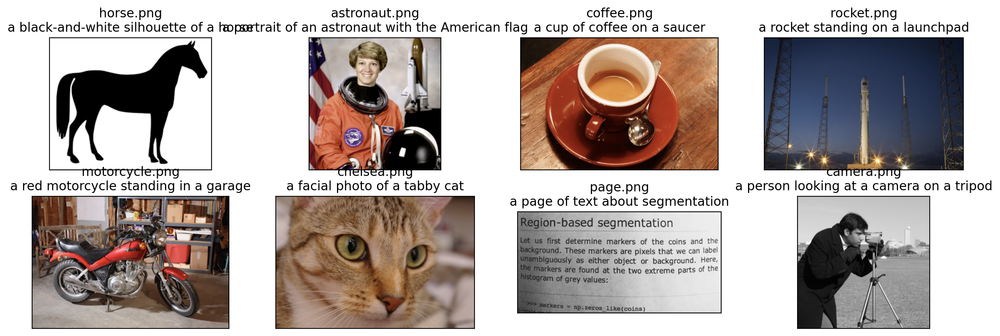

In [9]:
original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

# data_path = ("/content/drive/MyDrive/Semester1/DeepLearning/MiniProject2/data")
data_path = ("/Users/MNouh/Downloads/Post-Grad/Brown/Semester 1/Deep Learning/Homeworks/Mini-Project 2/data")

for filename in [filename for filename in os.listdir(data_path) if filename.endswith(".png") or filename.endswith(".jpg")]:
    name = os.path.splitext(filename)[0]
    if name not in descriptions:
        continue

    image = Image.open(os.path.join(data_path, filename)).convert("RGB")

    plt.subplot(2, 4, len(images) + 1)
    plt.imshow(image)
    plt.title(f"{filename}\n{descriptions[name]}")
    plt.xticks([])
    plt.yticks([])

    original_images.append(image)
    images.append(preprocess(image))
    texts.append(descriptions[name])

# plt.tight_layout()
plt.show()


## Building features

We normalize the images, tokenize each text input, and run the forward pass of the model to get the image and text features.

In [10]:
# image_input = torch.tensor(np.stack(images)).cuda()
# text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()
image_input = torch.tensor(np.stack(images))
text_tokens = clip.tokenize(["This is " + desc for desc in texts])

In [11]:
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()

## Calculating cosine similarity

We normalize the features and calculate the dot product of each pair.

In [12]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

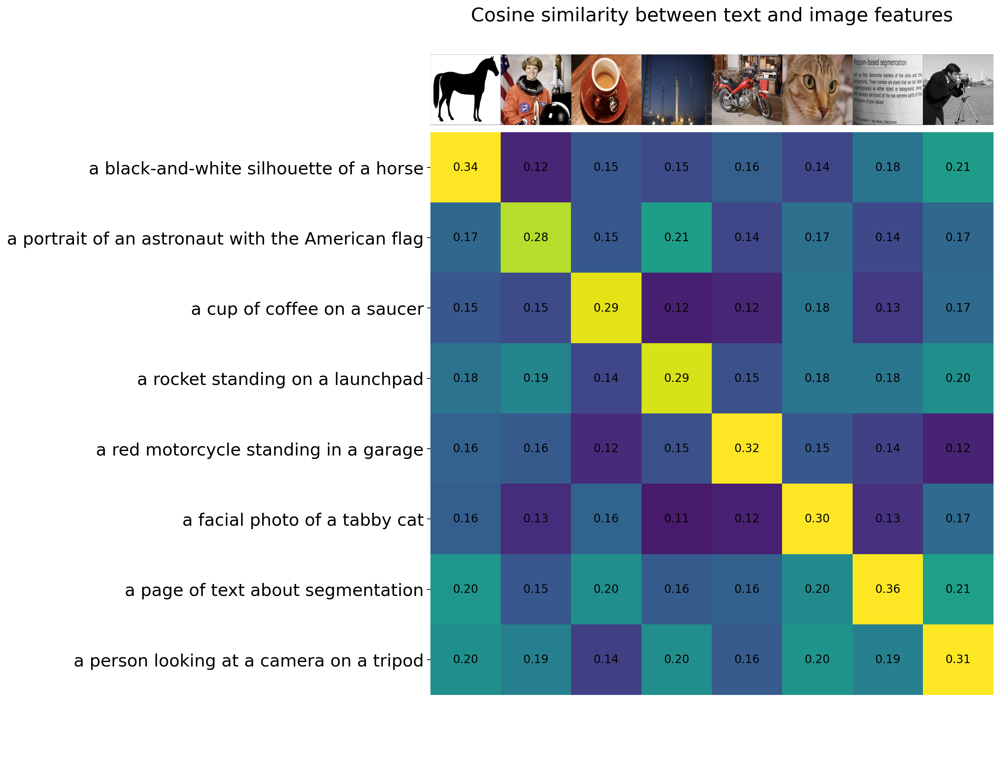

In [13]:
count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features", size=20)

plt.show()

# Zero-Shot Image Classification

You can classify images using the cosine similarity (times 100) as the logits to the softmax operation.

In [14]:
from torchvision.datasets import CIFAR100

cifar100 = CIFAR100(os.path.expanduser("~/.cache"), transform=preprocess, download=True)

Files already downloaded and verified


In [15]:
text_descriptions = [f"This is a photo of a {label}" for label in cifar100.classes]
text_tokens = clip.tokenize(text_descriptions)
# text_tokens = clip.tokenize(text_descriptions).cuda()

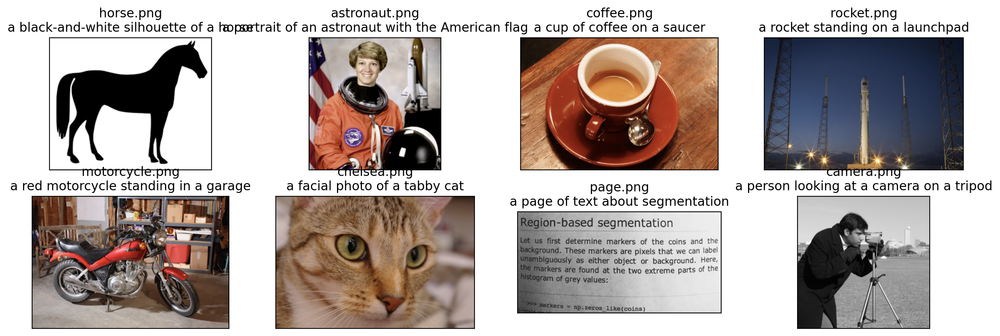

In [16]:
original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

# data_path = ("/content/drive/MyDrive/Semester1/DeepLearning/MiniProject2/data")
data_path = "/Users/MNouh/Downloads/Post-Grad/Brown/Semester 1/Deep Learning/Homeworks/Mini-Project 2/data"

for filename in [filename for filename in os.listdir(data_path) if filename.endswith(".png") or filename.endswith(".jpg")]:
    name = os.path.splitext(filename)[0]
    if name not in descriptions:
        continue

    image = Image.open(os.path.join(data_path, filename)).convert("RGB")

    plt.subplot(2, 4, len(images) + 1)
    plt.imshow(image)
    plt.title(f"{filename}\n{descriptions[name]}")
    plt.xticks([])
    plt.yticks([])

    original_images.append(image)
    images.append(preprocess(image))
    texts.append(descriptions[name])

# plt.tight_layout()
plt.show()


In [17]:
with torch.no_grad():
    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

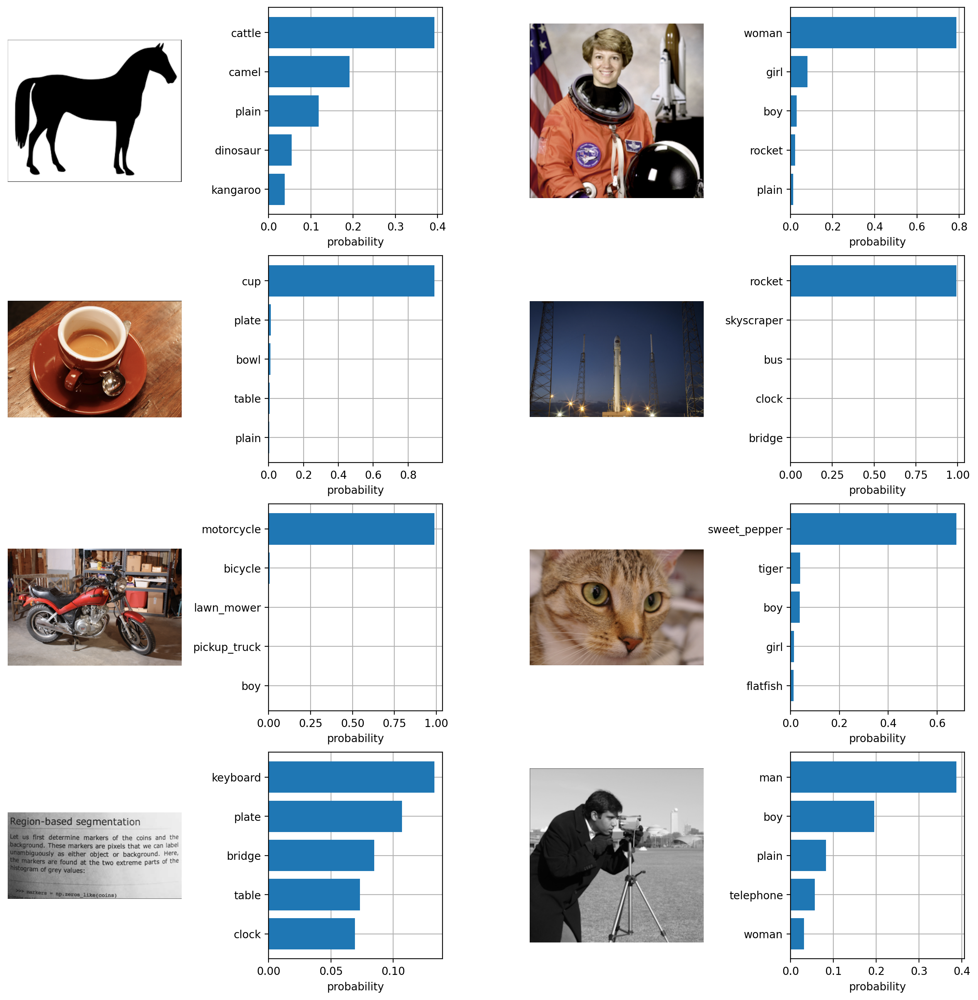

In [18]:
plt.figure(figsize=(16, 16))

for i, image in enumerate(original_images):
    plt.subplot(4, 4, 2 * i + 1)
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(4, 4, 2 * i + 2)
    y = np.arange(top_probs.shape[-1])
    plt.grid()
    plt.barh(y, top_probs[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)
    plt.yticks(y, [cifar100.classes[index] for index in top_labels[i].numpy()])
    plt.xlabel("probability")

plt.subplots_adjust(wspace=0.5)
plt.show()

# Step 1: Representing an image

## Task 1
Perform zero-shot image classification with CLIP on CIFAR-10. You only need to pick 500 random examples from the validation / test set of CIFAR-10.

In [19]:
from torchvision.datasets import CIFAR10

cifar10 = CIFAR10(os.path.expanduser("~/.cache"), download=True)

Files already downloaded and verified


In [20]:
text_descriptions = [f"This is a photo of a {label}" for label in cifar10.classes]
# text_tokens = clip.tokenize(text_descriptions).cuda()
text_tokens = clip.tokenize(text_descriptions)
print(text_descriptions)

['This is a photo of a airplane', 'This is a photo of a automobile', 'This is a photo of a bird', 'This is a photo of a cat', 'This is a photo of a deer', 'This is a photo of a dog', 'This is a photo of a frog', 'This is a photo of a horse', 'This is a photo of a ship', 'This is a photo of a truck']


2024-11-08 21:05:38.607478: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


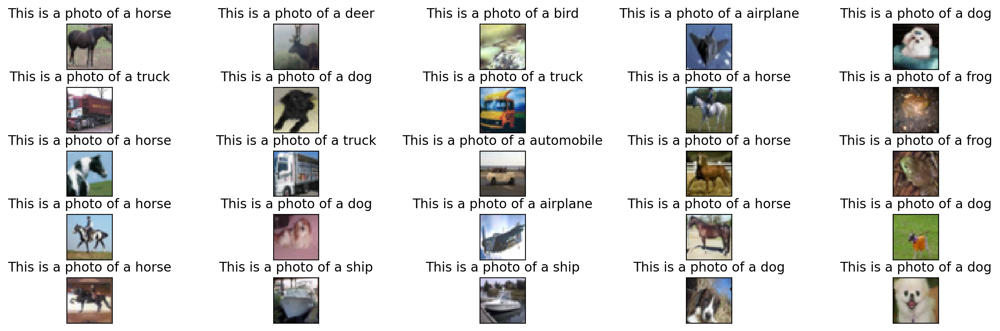

In [21]:
import tensorflow as tf

original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

# np.random.seed(42)
random_indices = np.random.choice(len(x_test), 500, replace=False, )

x_test = x_test[random_indices]
y_test = y_test[random_indices]

display_count = 25
num_cols = 5
num_rows = (display_count + num_cols - 1) // num_cols

for i in range(len(x_test)):
    image = Image.fromarray(np.uint8(x_test[i])).convert("RGB")
    label = y_test[i][0]

    # print(image)
    # print(label)
    if i < display_count:
      plt.subplot(num_rows, num_cols, i + 1)
      plt.imshow(image)
      plt.title(f"{text_descriptions[label]}")
      plt.xticks([])
      plt.yticks([])

    original_images.append(image)
    images.append(preprocess(image))
    texts.append(text_descriptions[label])

# plt.tight_layout()
plt.subplots_adjust(wspace=0.5, hspace=0.4)
plt.show()

In [22]:
print(np.array(original_images).shape)
print(np.array(texts).shape)

(500, 32, 32, 3)
(500,)


In [23]:
# image_input = torch.tensor(np.stack(images)).cuda()
# text_tokens = clip.tokenize(text_descriptions).cuda()
image_input = torch.tensor(np.stack(images))
text_tokens = clip.tokenize(text_descriptions)

In [24]:
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()

In [25]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

In [26]:
with torch.no_grad():
    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

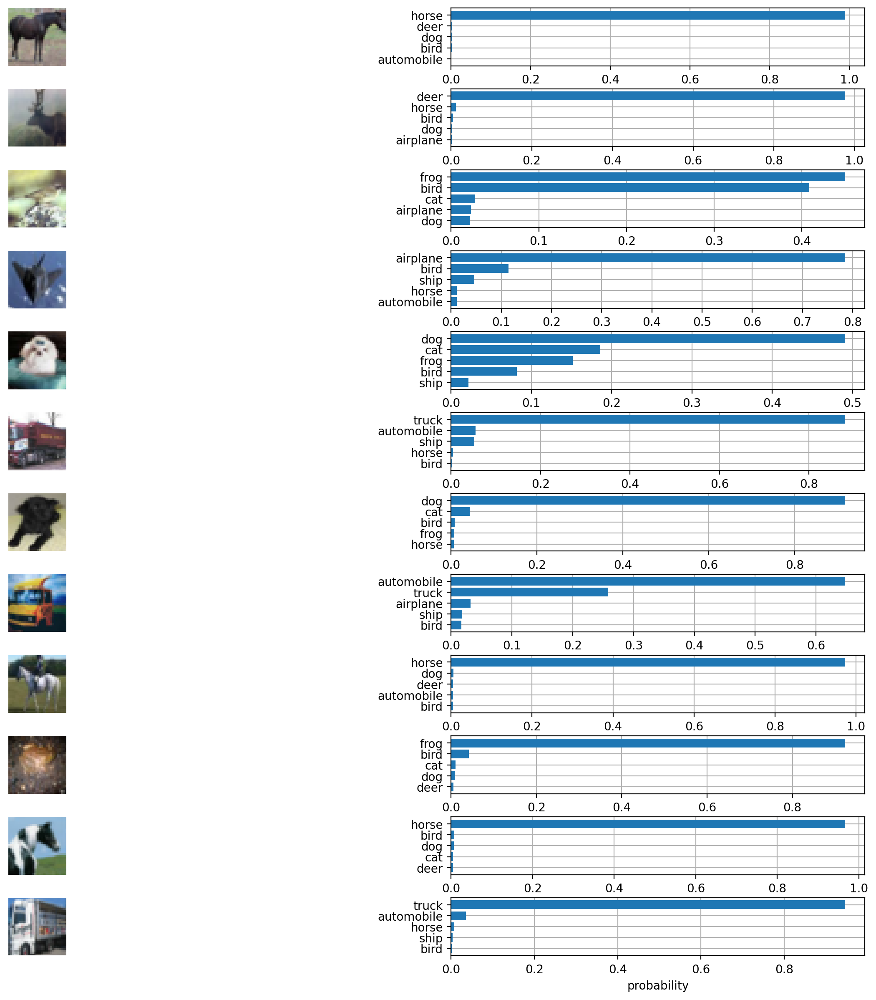

In [27]:
plt.figure(figsize=(16, 16))

display_count = 25
num_images = len(original_images)
num_cols = 2
num_rows = (display_count + num_cols - 1) // num_cols


for i, image in enumerate(original_images):
    # print(i)
    if i > display_count/2 - 1:
      break
    plt.subplot(num_rows, num_cols, 2 * i + 1)
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(num_rows, num_cols, 2 * i + 2)
    y = np.arange(top_probs.shape[-1])
    plt.grid()
    plt.barh(y, top_probs[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)
    plt.yticks(y, [cifar10.classes[index] for index in top_labels[i].numpy()])
    plt.xlabel("probability")

plt.subplots_adjust(wspace=0.5, hspace=0.4)
plt.show()

## Task 2
Perform linear probing with CLIP on CIFAR-10. You need to extract CLIP image embeddings for 1000 random examples from the training set of CIFAR-10, then train a linear classifier. Report classification accuracy on the same 500 random test examples as in Task 1.

In [28]:
random_indices = np.random.choice(len(x_train), 1000, replace=False)

x_train = x_train[random_indices]
y_train = y_train[random_indices]

print(np.array(x_train).shape)
print(np.array(y_train).shape)

(1000, 32, 32, 3)
(1000, 1)


In [29]:
# Function to get embeddings
def get_clip_embeddings(x_train):
    all_embeddings = []

    images_array = np.array(x_train)

    images_tensor = torch.from_numpy(images_array).permute(0, 3, 1, 2).float()  # Convert to shape (batch_size, channels, height, width)

    images_tensor = torch.nn.functional.interpolate(images_tensor, size=(224, 224))  # Resize to (224, 224)
    images_tensor = images_tensor / 255.0  # Normalize from [0, 255] to [0, 1]
    images_tensor = (images_tensor - 0.5) * 2  # CLIP normalizes to [-1, 1]

    with torch.no_grad():
        embeddings = model.encode_image(images_tensor).cpu().numpy()
        all_embeddings.extend(embeddings)
    return np.array(all_embeddings)

# Get embeddings for the images
x_train_embeddings = get_clip_embeddings(x_train)

In [30]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Train a linear classifier
classifier = LogisticRegression(random_state=42, C=0.316, max_iter=1000)
classifier.fit(x_train_embeddings, y_train)

x_test_embeddings = get_clip_embeddings(x_test)

# Predict and evaluate
y_pred = classifier.predict(x_test_embeddings)
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy * 100:.2f}%")

/opt/anaconda3/envs/csci2470/lib/python3.11/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Test Accuracy: 78.60%


In [31]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score

# Train an MLP classifier
mlp_classifier = MLPClassifier(hidden_layer_sizes=(128,128,), max_iter=1000)
mlp_classifier.fit(x_train_embeddings, y_train)

x_test_embeddings = get_clip_embeddings(x_test)

# Predict and evaluate
y_pred = mlp_classifier.predict(x_test_embeddings)
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy * 100:.2f}%")

/opt/anaconda3/envs/csci2470/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1105: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Test Accuracy: 76.00%


# Step 2: Socratic Method for image captioning

## Task 3

Convert an image into a list of objects with CLIP. There are several crucial missing pieces for you to figure out: 
(1) For the zero-shot classification example in Task 1, each image has only a single label. How can you output multiple objects for an image?; 
(2) What would make a good list of “candidate objects”? You might find it helpful to browse some image examples in the Flickr dataset; 
(3) Objects only or also attributes? In your list of candidate objects, do you intend to include “cat”, “dog”, or also “cute cat”, “lazy dog”?


### GPT3.5 Testing

In [ ]:
!pip install openai
import openai

# Create your own OpenAI API key
# https://help.openai.com/en/articles/4936850-where-do-i-find-my-secret-api-key
api_key = 'your key'

In [61]:
client = openai.OpenAI(api_key=api_key)

# In-context learning example to turn a list of objects into a caption.
# Note that the example was designed to be suboptimal on purpose.
completion = client.chat.completions.create(
    # Pricing: $0.50 / 1M tokens
    model="gpt-3.5-turbo-0125",
    messages=[
        {
            "role": "system",
            "content": "You are a helpful assistant. Use your imagination and"
                       "make the outputs as long and fancy as possible!!!"
        },
        {
            "role": "user",
            "content": "Your task is to convert a list of English words into a"
                       "nice looking sentence.",
        },
        {
            "role": "user",
            "content": "First example, input: cat,"
                       "output: The cat looks cute!",
        },
        {
            "role": "user",
            "content": "First example, input: cat, dog"
                       "output: The cat is chasing the dog and the dog looks"
                       "worried.",
        },
        {
            "role": "user",
            "content": "Query, input: cat, cheese, mouse, dog"
                       "output:",
        },
    ]
)

print(completion.choices[0].message.content)

The cat is stealthily approaching the cheese, while the mouse is nibbling on it, oblivious to the impending danger. Suddenly, the dog enters the scene and starts barking loudly, causing chaos and sending the cat and mouse scurrying in opposite directions.


In [62]:
client = openai.OpenAI(api_key=api_key)

completion = client.chat.completions.create(
    model="gpt-3.5-turbo-0125",
    messages=[
        {
            "role": "system",
            "content": "You are a helpful assistant. Convert lists of objects into"
                       "natural, descriptive, concise sentences about an image."
        },
        {
            "role": "user",
            "content": "Your task is to convert a list of objects into captions."
        },
        {
            "role": "user",
            "content": "Input: dog, tree, park,"
                        "output: A playful dog is running near a tree in the park."
        },
        {
            "role": "user",
            "content": "Input: snowman, child, winter coat,"
                       "output: A child in a winter coat stands happily next to a snowman."
        },
        {
            "role": "user",
            "content": "Input: beach, sun, people, umbrella,"
                       "output: People relax under umbrellas on a sunny beach."
        },
        {
            "role": "user",
            "content": "Input: cat, grass, sunlight,"
                       "output: A cat rests comfortably in the sunlight on the green grass."
        },
        {
            "role": "user",
            "content": "Query, input: boat, sea, people,"
                       "output: "
        },
    ]
)

print(completion.choices[0].message.content)

People are sailing on a boat in the sea.


### Generating Multiple Object Labels with CLIP

In [63]:
# use flickr 8k dataset for images with multiple labels 
# do clip with these images 
# top couple of labels --> candidate objects (or with threshold greater than a high prob)

In [64]:
import pandas as pd

# 5 captions per image
image_tokens = pd.read_csv("/Users/MNouh/Downloads/Post-Grad/Brown/Semester 1/Deep Learning/Homeworks/Mini-Project 2/archive/captions.txt",sep=',',names=["img_id","img_caption"])
# print(image_tokens.head(10))
# print(type(image_tokens))
# print(image_tokens.columns)
# print(image_tokens)

images = os.listdir("/Users/MNouh/Downloads/Post-Grad/Brown/Semester 1/Deep Learning/Homeworks/Mini-Project 2/archive/Images")
print(len(images))

8091


In [65]:
# creating a dictionary with the image and a list of its captions

captions={}
for i in range(1,len(image_tokens)):
    if image_tokens.loc[i, 'img_id'] not in captions:
        captions[image_tokens.loc[i, 'img_id']] = image_tokens.loc[i, 'img_caption']
    else:
        captions[image_tokens.loc[i, 'img_id']] += " " + image_tokens.loc[i, 'img_caption']

print(captions)

{'1000268201_693b08cb0e.jpg': 'A child in a pink dress is climbing up a set of stairs in an entry way . A girl going into a wooden building . A little girl climbing into a wooden playhouse . A little girl climbing the stairs to her playhouse . A little girl in a pink dress going into a wooden cabin .', '1001773457_577c3a7d70.jpg': 'A black dog and a spotted dog are fighting A black dog and a tri-colored dog playing with each other on the road . A black dog and a white dog with brown spots are staring at each other in the street . Two dogs of different breeds looking at each other on the road . Two dogs on pavement moving toward each other .', '1002674143_1b742ab4b8.jpg': 'A little girl covered in paint sits in front of a painted rainbow with her hands in a bowl . A little girl is sitting in front of a large painted rainbow . A small girl in the grass plays with fingerpaints in front of a white canvas with a rainbow on it . There is a girl with pigtails sitting in front of a rainbow pai

In [66]:
! pip install spacy

import spacy.cli
spacy.cli.download("en_core_web_sm")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 2.5 MB/s eta 0:00:00a 0:00:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [67]:
from collections import Counter
import spacy

"""
    the goal here is to count the occurence of each word in the dictionary "captions"'s values,
    for each key, and then filter based on a specific threshold, to keep the most common words only
    these will serve as multiple labels per image
    NOTE: need to filter nouns only 
"""

# Load the English model
nlp = spacy.load("en_core_web_sm")

nouns_dict = {}

for key, caption in captions.items():
    doc = nlp(caption)
    nouns = [token.text.lower() for token in doc if token.pos_ == 'NOUN']
    nouns_count = Counter(nouns)
    nouns_dict[key] = nouns_count

# Threshold for filtering
threshold = 2  

# Filter words based on threshold
filtered_common_words = {}
for key, counts in nouns_dict.items():
    filtered_words = [word for word, count in counts.items() if count >= threshold]
    filtered_common_words[key] = filtered_words

# Output filtered common words
print("Common words above the threshold:")
print(filtered_common_words)

Common words above the threshold:
{'1000268201_693b08cb0e.jpg': ['dress', 'stairs', 'girl', 'playhouse'], '1001773457_577c3a7d70.jpg': ['dog', 'road', 'dogs'], '1002674143_1b742ab4b8.jpg': ['girl', 'front', 'rainbow', 'grass', 'pigtails'], '1003163366_44323f5815.jpg': ['man', 'bench', 'dog'], '1007129816_e794419615.jpg': ['man', 'hat', 'glasses'], '1007320043_627395c3d8.jpg': ['child', 'rope', 'girl', 'climbs', 'ropes', 'playground'], '1009434119_febe49276a.jpg': ['dog', 'fence', 'grass'], '1012212859_01547e3f17.jpg': ['dog', 'head', 'shore', 'ball', 'water'], '1015118661_980735411b.jpg': ['boy', 'front', 'wall', 'street', 'man', 'overalls', 'stone'], '1015584366_dfcec3c85a.jpg': ['dog', 'log', 'tree'], '101654506_8eb26cfb60.jpg': ['dog', 'snow'], '101669240_b2d3e7f17b.jpg': ['man', 'hat', 'pictures', 'skier', 'skis', 'snow'], '1016887272_03199f49c4.jpg': ['group', 'people', 'rock', 'climbing', 'man', 'climbers'], '1019077836_6fc9b15408.jpg': ['dog', 'sprinkler', 'lawn', 'hose'], '1019

## Task 4 

Convert a list of objects into a sentence with GPT-3.5. Our notebook already provides some examples for in-context learning, but you would need to decide on the in-context examples to provide to GPT-3.5.


In [68]:
# divide the data into train and test:

split_index = int(len(images) * 0.8)
train_images = images[:split_index]
test_images = images[split_index:]
train_data = {img: filtered_common_words[img] for img in train_images if img in filtered_common_words}
test_data = {img: filtered_common_words[img] for img in test_images if img in filtered_common_words}


In [69]:
words_to_sentence = {}

for key, value in test_data.items():
    nouns = test_data[key]
    nouns_str = ", ".join(nouns) 

    client = openai.OpenAI(api_key=api_key)

    completion = client.chat.completions.create(
        model="gpt-3.5-turbo-0125",
        messages=[
            {
                "role": "system",
                "content": "You are a helpful assistant. Convert lists of objects into "
                        "natural, descriptive, concise sentences about an image."
            },
            {
                "role": "user",
                "content": "Your task is to convert a list of objects into captions."
            },
            {
                "role": "user",
                "content": "Input: dog, tree, park, "
                        "output: A playful dog is running near a tree in the park."
            },
            {
                "role": "user",
                "content": "Input: snowman, child, winter coat, "
                        "output: A child in a winter coat stands happily next to a snowman."
            },
            {
                "role": "user",
                "content": "Input: beach, sun, people, umbrella, "
                        "output: People relax under umbrellas on a sunny beach."
            },
            {
                "role": "user",
                "content": "Input: cat, grass, sunlight, "
                        "output: A cat rests comfortably in the sunlight on the green grass."
            },
            {
                "role": "user",
                "content": f"Query, input: {nouns_str}, "
                        "output: "
            },
        ]
    )

    words_to_sentence[key] = completion.choices[0].message.content

In [70]:
print(words_to_sentence)

{'3286017638_c688c83e3d.jpg': 'A soccer player kicks the ball on the field.', '2798880731_4f51634374.jpg': 'A woman and a man celebrate a birthday with children over a video call.', '1417941060_2a0f7908bc.jpg': 'A baby boy with an expressive face captivates the viewer.', '720208977_f44c2bba5b.jpg': 'Children joyfully play in and around the fountains of water.', '3100442775_6e2659b973.jpg': 'A man leans his bike against a wall.', '3520869880_2e8b7d7842.jpg': 'In front of a vibrant mural, a girl in a dress poses elegantly.', '2240539658_dea8db6e55.jpg': 'Dogs frolic happily in the snow.', '96973080_783e375945.jpg': 'A happy dog plays in the snow.', '2421446839_fe7d46c177.jpg': 'A woman is playing with a dog near a car.', '262446581_06ef7d9445.jpg': 'A man with a backpack sits on a log by the river.', '2831217847_555b2f95ca.jpg': 'An SUV is parked in a scenic area near a tranquil stream.', '3099923914_fd450f6d51.jpg': 'In front of a brick building, people sit at a table enjoying drinks.',

## Task 5
Run your pipeline on at least 10 images from the validation / test set of Flickr 8k, and summarize your qualitative observations. Are you happy with what you got?

In [71]:
text_tokens = clip.tokenize(words_to_sentence)

3182405529_7692256746.jpg
10


<Figure size 1600x500 with 0 Axes>

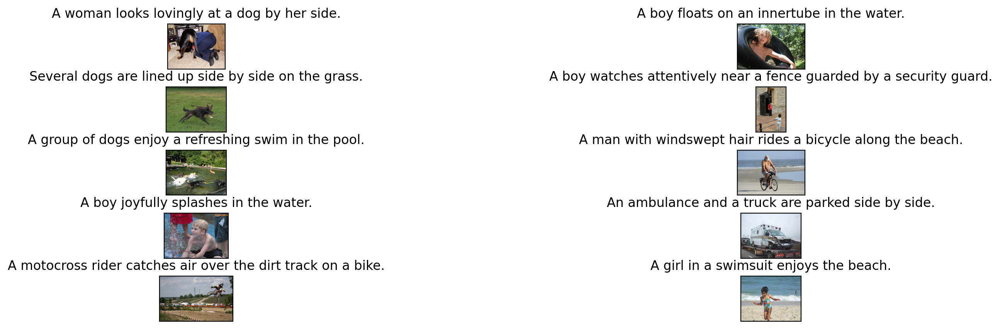

In [72]:
import tensorflow as tf

original_images = []
images = []
texts = []
folder_path = '/Users/MNouh/Downloads/Post-Grad/Brown/Semester 1/Deep Learning/Homeworks/Mini-Project 2/archive/Images'
plt.figure(figsize=(16, 5))

(x_train, y_train), (x_testt, y_testt) = (np.array(train_images), train_data), (np.array(test_images), test_data)

random_indices = np.random.choice(len(x_test), 10, replace=False)

print(x_test[0])

x_test = x_testt[random_indices]
# y_test = y_test[random_indices]

display_count = 10
num_cols = 2
num_rows = (display_count + num_cols - 1) // num_cols

print(len(x_test))

for i in range(len(x_test)):
# for i in range(display_count):
    image_path = os.path.join(folder_path, x_test[i])
    image = Image.open(image_path)
    image = image.convert("RGB")
    # print(y_testt)
    label = y_testt[x_test[i]]

    # print(image)
    # print(words_to_sentence[x_test[i]])
    if i < display_count:
      plt.subplot(num_rows, num_cols, i + 1)
      plt.imshow(image)
      plt.title(words_to_sentence[x_test[i]])
      plt.xticks([])
      plt.yticks([])

    original_images.append(image)
    images.append(preprocess(image))
    texts.append(words_to_sentence[x_test[i]])

# plt.tight_layout()
plt.subplots_adjust(wspace=0.5, hspace=0.4)
plt.show()

In [73]:
image_input = torch.tensor(np.stack(images))

In [74]:
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    # text_features = model.encode_text(text_tokens).float()

In [75]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

In [76]:
text_tokens = clip.tokenize(texts)
with torch.no_grad():
    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

In [77]:
print(texts)

['A woman looks lovingly at a dog by her side.', 'A boy floats on an innertube in the water.', 'Several dogs are lined up side by side on the grass.', 'A boy watches attentively near a fence guarded by a security guard.', 'A group of dogs enjoy a refreshing swim in the pool.', 'A man with windswept hair rides a bicycle along the beach.', 'A boy joyfully splashes in the water.', 'An ambulance and a truck are parked side by side.', 'A motocross rider catches air over the dirt track on a bike.', 'A girl in a swimsuit enjoys the beach.']


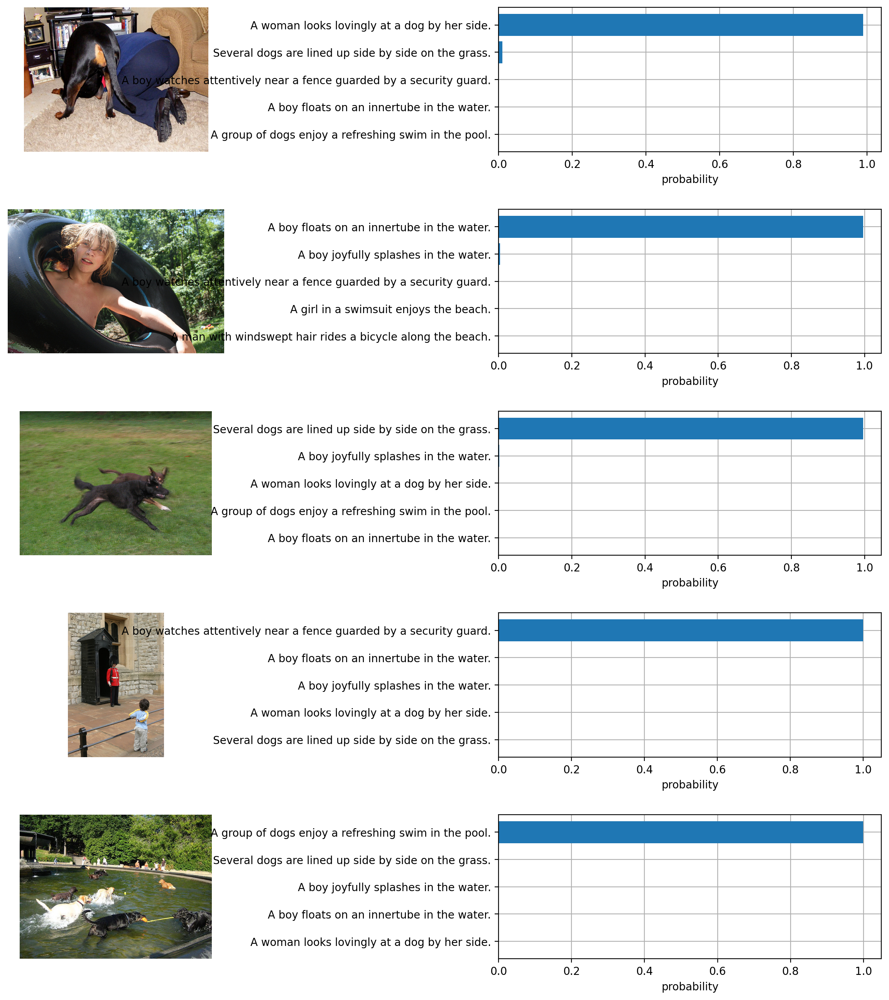

In [78]:
plt.figure(figsize=(16, 16))

display_count = 10
num_images = len(original_images)
num_cols = 2
num_rows = (display_count + num_cols - 1) // num_cols


for i, image in enumerate(original_images):
  # print(i)
  if i > display_count/2 - 1:
    break
  plt.subplot(num_rows, num_cols, 2 * i + 1)
  plt.imshow(image)
  plt.axis("off")

  plt.subplot(num_rows, num_cols, 2 * i + 2)
  y = np.arange(top_probs.shape[-1])
  plt.grid()
  plt.barh(y, top_probs[i])
  plt.gca().invert_yaxis()
  plt.gca().set_axisbelow(True)
  # plt.yticks(y, [cifar10.classes[index] for index in top_labels[i].numpy()])
  # print(top_labels[0].numpy())
  # print(text_tokens)
  # print(len(words_to_sentence))
  plt.yticks(y, [words_to_sentence[x_test[index]] for index in top_labels[i].numpy()])

  plt.xlabel("probability")

plt.subplots_adjust(wspace=0.5, hspace=0.4)
plt.show()

### Conclusion
The results are not satisfying, the captions are not related to the image, the model is failing.

# Step 3: Quantitative Evaluation for image captioning

## Task 6 
Run your pipeline on at least 100 images from the validation / test set of Flickr 8k, and compute at least one quantitative metric of your choice. How does your result compare with the previously published results on Flickr 8k image captioning? Do you find tweaking the list of objects (for CLIP) or the in-context examples (for GPT-3) make any quantitative differences?


1619
2467850190_07a74d89b7.jpg
100


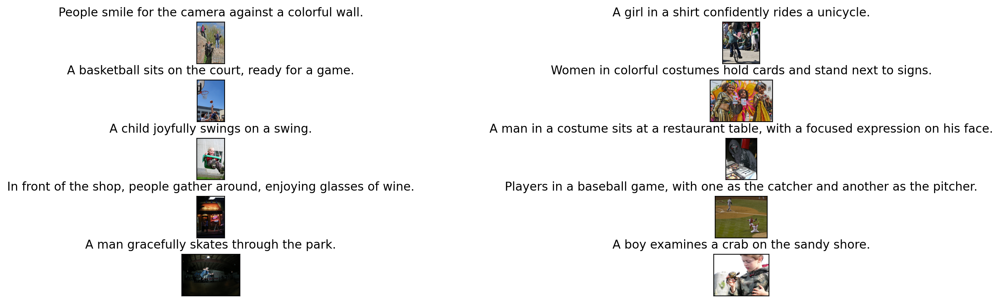

In [79]:
import tensorflow as tf

original_images = []
images = []
texts = []
folder_path = '/Users/MNouh/Downloads/Post-Grad/Brown/Semester 1/Deep Learning/Homeworks/Mini-Project 2/archive/Images'
plt.figure(figsize=(16, 5))

(x_train, y_train), (x_testt, y_testt) = (np.array(train_images), train_data), (np.array(test_images), test_data)

print(len(x_testt))
random_indices = np.random.choice(len(x_testt), 100, replace=False)

print(x_test[0])

x_test = x_testt[random_indices]
# y_test = y_test[random_indices]

display_count = 10
num_cols = 2
num_rows = (display_count + num_cols - 1) // num_cols

print(len(x_test))

for i in range(len(x_test)):
# for i in range(display_count):
    image_path = os.path.join(folder_path, x_test[i])
    image = Image.open(image_path)
    image = image.convert("RGB")
    label = y_testt[x_test[i]]

    # print(image)
    # print(words_to_sentence[x_test[i]])
    if i < display_count:
      plt.subplot(num_rows, num_cols, i + 1)
      plt.imshow(image)
      plt.title(words_to_sentence[x_test[i]])
      plt.xticks([])
      plt.yticks([])

    original_images.append(image)
    images.append(preprocess(image))
    texts.append(words_to_sentence[x_test[i]])

# plt.tight_layout()
plt.subplots_adjust(wspace=0.5, hspace=0.4)
plt.show()

In [80]:
image_input = torch.tensor(np.stack(images))
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    image_features /= image_features.norm(dim=-1, keepdim=True)

image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

text_tokens = clip.tokenize(texts)
with torch.no_grad():
    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

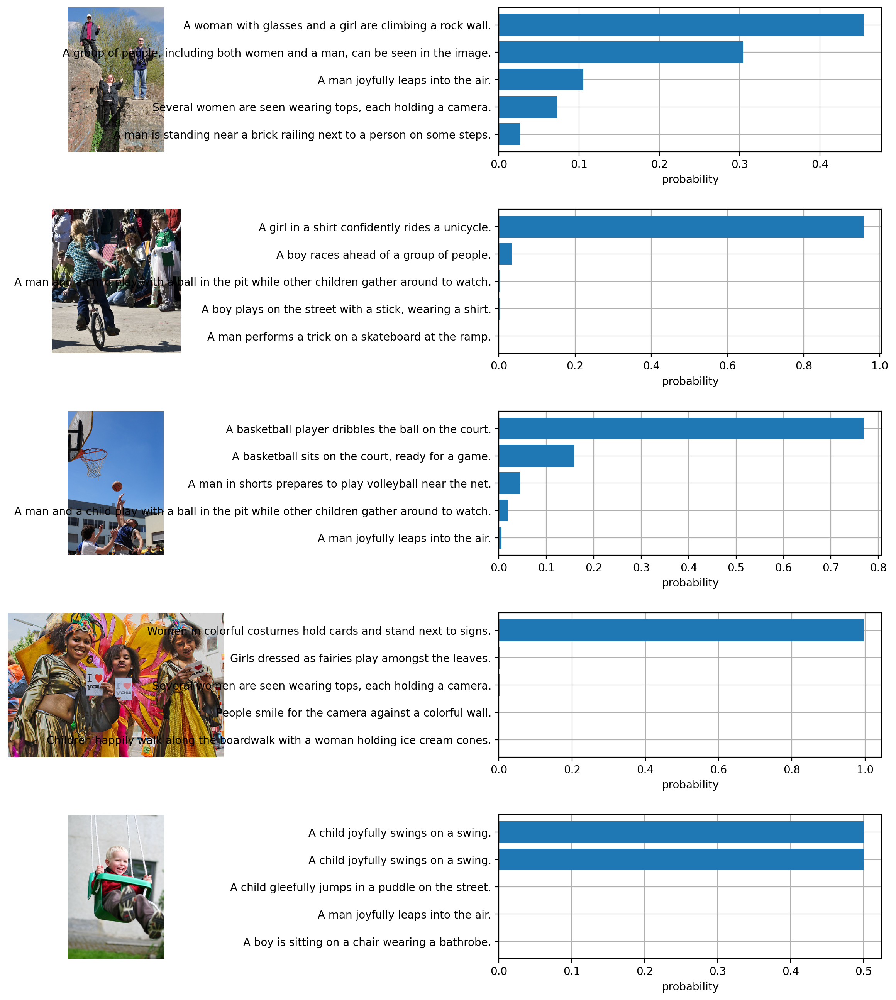

In [81]:
plt.figure(figsize=(16, 16))

display_count = 10
num_images = len(original_images)
num_cols = 2
num_rows = (display_count + num_cols - 1) // num_cols


for i, image in enumerate(original_images):
  # print(i)
  if i > display_count/2 - 1:
    break
  plt.subplot(num_rows, num_cols, 2 * i + 1)
  plt.imshow(image)
  plt.axis("off")

  plt.subplot(num_rows, num_cols, 2 * i + 2)
  y = np.arange(top_probs.shape[-1])
  plt.grid()
  plt.barh(y, top_probs[i])
  plt.gca().invert_yaxis()
  plt.gca().set_axisbelow(True)
  # plt.yticks(y, [cifar10.classes[index] for index in top_labels[i].numpy()])
  # print(top_labels[0].numpy())
  # print(text_tokens)
  # print(len(words_to_sentence))
  plt.yticks(y, [words_to_sentence[x_test[index]] for index in top_labels[i].numpy()])

  plt.xlabel("probability")

plt.subplots_adjust(wspace=0.5, hspace=0.4)
plt.show()

### Conclusion
Results are much better with a larger dataset, the difference between 10 and 100 images is remarkable. 
Most captions are acceptable even if they are not the highest probability, we see that the second or third captions sometimes are just as good.
The model depends on the data it sees, with larger dataset or a dataset with similar photos/context, the model seems to perform better, as the different captions become more related to the image, leading to multiple caption having a high probability.
It was also observed that different test batches (due to random index generation) lead to different results, but similar overall performance.

In [82]:
! pip install torchmetrics

  Using cached numpy-1.26.4-cp311-cp311-macosx_10_9_x86_64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp311-cp311-macosx_10_9_x86_64.whl (20.6 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
blis 1.0.1 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.
thinc 8.3.2 requires numpy<2.1.0,>=2.0.0; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.


In [83]:
print(x_test[top_labels[0][0]])
print(words_to_sentence[x_test[top_labels[0][0]]])
print(captions[x_test[top_labels[0][0]]])
print(len(x_test))
print(type(words_to_sentence[x_test[top_labels[0][0]]]))
print(type(captions[x_test[top_labels[0][0]]]))

416992999_654a99a903.jpg
A woman with glasses and a girl are climbing a rock wall.
A girl wearing glasses is in a blue harness while rock climbing . Girl climbing rock wall Girl rock climbing on the rock wall . The woman in glasses is climbing a steep rock wall . Young woman climbing rock face
100
<class 'str'>
<class 'str'>


In [84]:
import torch
from torchmetrics.text.bleu import BLEUScore

bleu = BLEUScore(n_gram=1) 

all_bleu_scores = []

for i in range(len(x_test)):

    # Calculate BLEU score
    score = bleu([words_to_sentence[x_test[top_labels[i][0]]]], [captions[x_test[top_labels[i][0]]]])
    # score = bleu(clip.tokenize(words_to_sentence[x_test[top_labels[i][0]]]), clip.tokenize(captions[x_test[top_labels[i][0]]]))

    all_bleu_scores.append(score)
    print(f"BLEU Score: {score}")


average_bleu = sum(all_bleu_scores) / len(all_bleu_scores)
print(f"Average BLEU Score: {average_bleu}")

BLEU Score: 0.1666666567325592
BLEU Score: 0.2222222089767456
BLEU Score: 0.1111111044883728
BLEU Score: 0.0
BLEU Score: 0.2857142984867096
BLEU Score: 0.11764705926179886
BLEU Score: 0.0
BLEU Score: 0.06666666269302368
BLEU Score: 0.1818181872367859
BLEU Score: 0.2222222089767456
BLEU Score: 0.1666666567325592
BLEU Score: 0.1666666567325592
BLEU Score: 0.19999998807907104
BLEU Score: 0.25
BLEU Score: 0.1428571492433548
BLEU Score: 0.13333332538604736
BLEU Score: 0.1818181872367859
BLEU Score: 0.1666666567325592
BLEU Score: 0.1111111044883728
BLEU Score: 0.1666666567325592
BLEU Score: 0.25
BLEU Score: 0.09999999403953552
BLEU Score: 0.25
BLEU Score: 0.19999998807907104
BLEU Score: 0.1666666567325592
BLEU Score: 0.1428571492433548
BLEU Score: 0.2857142984867096
BLEU Score: 0.15384617447853088
BLEU Score: 0.125
BLEU Score: 0.19999998807907104
BLEU Score: 0.2222222089767456
BLEU Score: 0.1428571492433548
BLEU Score: 0.25
BLEU Score: 0.19999998807907104
BLEU Score: 0.25
BLEU Score: 0.14285

In [85]:
! pip install rouge-score

In [86]:
from rouge_score import rouge_scorer

# Initialize ROUGE scorer
rouge_scorer = rouge_scorer.RougeScorer(['rougeL'], use_stemmer=True)

all_rouge_scores = []

for i in range(len(x_test)):
    # Get prediction and reference
    pred = words_to_sentence[x_test[top_labels[i][0]]]
    refs = captions[x_test[top_labels[i][0]]][0]  # Using the first reference caption as an example

    # Calculate ROUGE-L score
    rouge_score = rouge_scorer.score(pred, refs)['rougeL'].fmeasure
    all_rouge_scores.append(rouge_score)
    print(f"ROUGE-L Score: {rouge_score}")

# Average ROUGE-L Score
average_rouge = sum(all_rouge_scores) / len(all_rouge_scores)
print(f"Average ROUGE-L Score: {average_rouge}")

ROUGE-L Score: 0.15384615384615385
ROUGE-L Score: 0.19999999999999998
ROUGE-L Score: 0.19999999999999998
ROUGE-L Score: 0.0
ROUGE-L Score: 0.25
ROUGE-L Score: 0.1111111111111111
ROUGE-L Score: 0.0
ROUGE-L Score: 0.125
ROUGE-L Score: 0.16666666666666669
ROUGE-L Score: 0.19999999999999998
ROUGE-L Score: 0.15384615384615385
ROUGE-L Score: 0.15384615384615385
ROUGE-L Score: 0.18181818181818182
ROUGE-L Score: 0.2222222222222222
ROUGE-L Score: 0.25
ROUGE-L Score: 0.125
ROUGE-L Score: 0.16666666666666669
ROUGE-L Score: 0.15384615384615385
ROUGE-L Score: 0.19999999999999998
ROUGE-L Score: 0.15384615384615385
ROUGE-L Score: 0.2222222222222222
ROUGE-L Score: 0.18181818181818182
ROUGE-L Score: 0.2222222222222222
ROUGE-L Score: 0.18181818181818182
ROUGE-L Score: 0.15384615384615385
ROUGE-L Score: 0.0
ROUGE-L Score: 0.25
ROUGE-L Score: 0.14285714285714288
ROUGE-L Score: 0.11764705882352941
ROUGE-L Score: 0.18181818181818182
ROUGE-L Score: 0.19999999999999998
ROUGE-L Score: 0.0
ROUGE-L Score: 0.2222

In [87]:
! pip install git+https://github.com/salaniz/pycocoevalcap

  Cloning https://github.com/salaniz/pycocoevalcap to /private/var/folders/bs/rsl2fgcs0kz_48v8_rlhcjt80000gp/T/pip-req-build-0jwxypd5
  Running command git clone --filter=blob:none --quiet https://github.com/salaniz/pycocoevalcap /private/var/folders/bs/rsl2fgcs0kz_48v8_rlhcjt80000gp/T/pip-req-build-0jwxypd5
  Resolved https://github.com/salaniz/pycocoevalcap to commit a24f74c408c918f1f4ec34e9514bc8a76ce41ffd
  Preparing metadata (setup.py) ... done


In [88]:
from pycocoevalcap.cider.cider import Cider

# Initialize CIDEr scorer
cider_scorer = Cider()

all_cider_scores = []

for i in range(len(x_test)):
    # Prepare data for CIDEr metric
    refs_dict = {0: [captions[x_test[top_labels[i][0]]]]}
    hyps_dict = {0: [words_to_sentence[x_test[top_labels[i][0]]]]}
    # refs_dict = [captions[x_test[top_labels[i][0]]]]

    # Calculate CIDEr score
    cider_score, _ = cider_scorer.compute_score(refs_dict, hyps_dict)
    all_cider_scores.append(cider_score)
    # print(f"CIDEr Score: {cider_score}")

# Average CIDEr Score
average_cider = sum(all_cider_scores) / len(all_cider_scores)
# print(f"Average CIDEr Score: {average_cider}")

# Step 4: Discussion on how to improve your model

## Task 7 
Write about the limitations of our implementation and how you plan to improve the limitations. Name at least three different methods to improve the implementation. Please note that this is open-ended, and as long as your solution is reasonable, you will get credit for this task.


Problem #1 : Implementation of multiple objects for an image
To do this part, I went through the given captions and chose only nouns that occurred more than twice in the five captions of each image. This implementation is problematic as each image has a different number of objects, leading to some captions being more descriptive and detailed than others, as they generate the sentences from these objects. Moreover, choosing only nouns and removing adjectives and verbs lost some of the information that was present in the original database. 
Solution -- I would consider keeping verbs or nominal groups to make the objects more meaningful. I would also consider removing plurals before applying this method, as it is currently keeping the same noun twice if it was present in a sentence as a singular noun and in another as a plural, which might affect GPT 3.5's performance as it can give more importance to repeated words, or incorporate the words stemming from the same root twice in a sentence (ie. skier is skiing). 

Problem #2 : Bias
It was noticed that this implementation can be biased toward some specific captions/classes due to the data it is trained on, as seen from the difference between a test set of just 10 images, versus when testing it on 100 images. Not only that, but the data in those images do contribute to the overall performance of the model. This limited exposure leads to bad generalization. 
Solution -- expanding the implementation to use all dataset points, because if the jump is nearly as good as the one seen between the performance of the model given 10 test points, compared to its improvement when given 100 points, then that would lead to a more generalizable, a generally better implementation of this approach.

Problem #3 : GPT 3.5 performance 
Upon testing, it was observed that the model generates better, more descriptive captions when given a longer list of objects. It is also shown that the overall implementation shows better results when the in context learning of the GPT 3.5 model is more detailed, has more examples and is more similar to the actual objects that are given to it and its expected output. Captions based on a smaller number of objects tend to throw off the generation of GPT, leading to misclassification of the images and captions that lack context. 
Solution -- using detailed prompting (highlighting how to build the relationship between objects, actions and the background, leading to detailed captions) will improve the contextual depth of the captions, ensuring accurate captioning of the image content. 

Problem #4 : Zero shot classification
It seems like the model could perform better if trained, as zero shot classification can struggle with complex objects due to its limited exposure to images leading to relatively weak object recognition. The low performance is seen through the quantitative scoring metrics performed in step 3. 
Solution -- fine tuning the model to the task at hand or training a small model on top of CLIP specifically for this kind of images to improve the overall performance of the model at recognizing objects specific to this dataset.